<a href="https://colab.research.google.com/github/mbovyn/LocustsBuhl2006/blob/master/LocustVick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Simulation and Visualization for
# From Disorder to Order in Marching Locusts
Buhl et al. Science 2006

In [0]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Simulation and parameters are described in Figure 1 legend:

Characteristic output of the model for the dynamics of Φt over time and with 3 (A), 11 (B), and 47 (C) individuals. The Vicsek et al. SPP model (1) consists of a set of pointwise particles moving synchronously and interacting locally by trying to align with their neighbors (1, 4). We used a variant of the one-dimensional version of their SPP model (30), where N particles move along a line of length L at a discrete time step Δt = 1. Each particle is characterized by its position xi and a dimensionless velocity ui and is updated as follows: xi(t + 1) = xi(t) + v0ui(t), ui(t + 1) = αui(t) + (1 – α)G(〈u(t) 〉i) + ξi, where 〈u 〉i denotes the average velocity of all other particles, excluding particle i, with in an interaction range [xi – Δ, xi + Δ]. The term α determines the relative weight that the particle assigns to its own velocity and to that of its neighbors in deciding its velocity. For locusts, α corresponds to a directional inertia when walking in the absence of conspecifics. ξi is a noise term, randomly chosen with a uniform probability from the interval [–η/2, η/2]. The function G represents the adjustment of a particle velocity to the velocity of its neighbors, implemented as follows

Embedded Image

Simulations were run by applying random initial conditions and periodic boundaries. The parameters were set to mimic the walking speed and interaction range of locusts in an arena (see SOM). T = 8000 time steps (8 hours), L = 36 (251.3 cm), v0 = 1 (1.9 cm/s), Δ = 2 (13.9 cm), α = 0.66. The noise term η = 0.8 was set by trial and error. We used the average velocity Φt = 〈u(t) 〉 as the measure of the order in the system to compare the simulations to the alignment measured experimentally.

Define the function G and take a look at it

In [0]:
def G(u):
  if u > 0:
    return (u+1)/2;
  elif u < 0:
    return (u-1)/2;
  else:
    return 0;

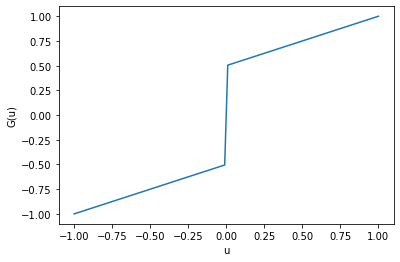

In [65]:
x=np.linspace(-1,1,100)
y=np.zeros(100)
for i in range(100):
  xx=x[i]
  y[i]=G(xx)
plt.plot(x,y);
plt.gca().set_ylabel('G(u)');
plt.gca().set_xlabel('u');

## Simulate

In [0]:
def create_trajectory(v0,alpha0,eta,delta,L,steps,locusts,fraction_defectors):

  #add some random locusts which don't care about the motions of others (alpha=1)
  n_defectors=np.ceil(fraction_defectors*locusts)
  defectors=np.random.choice(locusts, int(n_defectors), replace=False)
  alpha=alpha0*np.ones(locusts)
  alpha.put(defectors,1)

  #initialize locations, speeds, alignment
  x=np.zeros((steps,locusts))
  u=np.zeros((steps,locusts))
  phi=np.zeros(steps)
  #initial condition: random spots and speeds
  x[0,:]=np.random.uniform(0,L,(1,locusts))
  u[0,:]=np.random.uniform(-v0,v0,(1,locusts))
  #Which locusts can be seen by locust 1, for animation
  inrange1=[]

  #simulate for each time step and locust
  for t in range(steps-1):
    for i in range(locusts):
      ### model equation 1: next position ###
      x[t+1,i]=x[t,i]+v0*u[t,i]
      #######################################
      #periodic boundary condition
      if x[t+1,i] > L:
        x[t+1,i] = x[t+1,i]-L
      elif x[t+1,i] < 0:
        x[t+1,i] = L + x[t+1,i]
      
      #each locust ignores it's own velocity
      positions_to_check=np.delete(x[t,:],i)
      velocities_to_check=np.delete(u[t,:],i)
      
      #account for periodic boundary conditions in picking who is close enough to see
      if (x[t,i]+delta < L) and (x[t,i]-delta > 0):
        inrange=np.logical_and(positions_to_check < (x[t,i]+delta) , positions_to_check > (x[t,i]-delta) )
      elif x[t,i]+delta > L:
        inrange= np.logical_or(np.logical_and(positions_to_check < L , positions_to_check > (x[t,i]-delta) ) , np.logical_and( positions_to_check < ((x[t,i]+delta)-L) , positions_to_check > 0 ))
      elif x[t,i]-delta < 0:
        inrange= np.logical_or(np.logical_and( positions_to_check < (x[t,i]+delta) , positions_to_check > 0 ) , np.logical_and( positions_to_check < L , positions_to_check > L+(x[t,i]-delta) ))

      #find next velocity
      velocities_to_average=velocities_to_check[inrange]
      if velocities_to_average.size==0:
        mean_u_in_range=0
      else:
        mean_u_in_range=np.mean(velocities_to_average)
      ### model equation 2: next velocity ###
      u[t+1,i]=alpha[i]*u[t,i]+(1-alpha[i])*G(mean_u_in_range)+np.random.uniform(-eta/2,eta/2)
      #######################################
      
      #something about having alpha=1 makes things unstable, so enforce cap on u
      if u[t+1,i]>1:
        u[t+1,i]=1
      elif u[t+1,i]<-1:
        u[t+1,i]=-1

      #save the locusts that locust 1 can see
      if i==1:
        inrange1.append(positions_to_check[inrange])

    #calculate the disorder metric
    phi[t]=np.mean(u[t,:])

  return(x,phi,inrange1,alpha==1)

Run simulation for different densities

In [0]:
#parameter values from figure legend
v0=1
alpha0=.66
eta=.8
delta=2
L=36

#new parameter
fraction_defectors=.2

#
steps=8000
locust_nums=[3,6,11,47]

#store results from different numbers of locusts
x_all=[None] * np.size(locust_nums)
phi_all=[None] * np.size(locust_nums)
inrange1_all=[None] * np.size(locust_nums)
defectors_all=[None] * np.size(locust_nums)

#run simulations
i=0
for locusts in locust_nums:

  x_all[i], phi_all[i], inrange1_all[i], defectors_all[i]=create_trajectory(v0,alpha0,eta,delta,L,steps,locusts,fraction_defectors)
  i=i+1


Plot trajectories for each locust

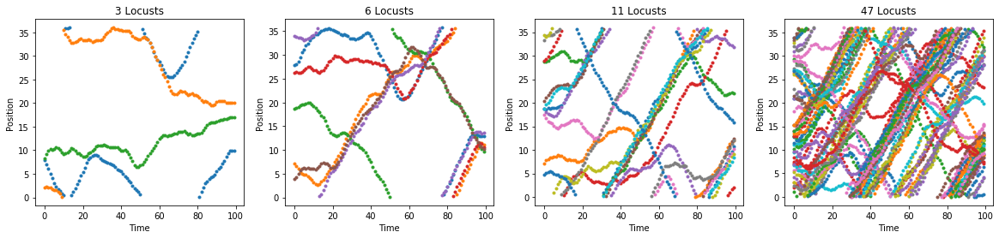

In [194]:
fig, ax = plt.subplots(1,np.size(locust_nums),squeeze=False)
fig.set_figwidth(5*np.size(locust_nums))
for i in range(np.size(locust_nums)):
  ax[0,i].plot(range(100),x_all[i][0:100,:],'.');
  ax[0,i].set_ylabel('Position');
  ax[0,i].set_xlabel('Time');
  ax[0,i].set_title(str(locust_nums[i])+' Locusts')

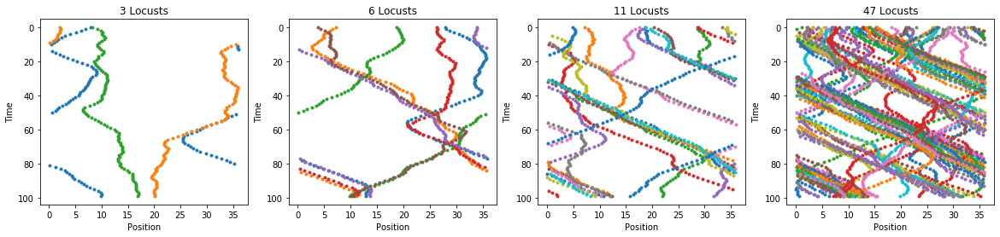

In [195]:
fig, ax = plt.subplots(1,np.size(locust_nums),squeeze=False)
fig.set_figwidth(5*np.size(locust_nums))
for i in range(np.size(locust_nums)):
  ax[0,i].plot(x_all[i][0:100,:],range(100),'.')
  ax[0,i].invert_yaxis()
  ax[0,i].set_ylabel('Time')
  ax[0,i].set_xlabel('Position')
  ax[0,i].set_title(str(locust_nums[i])+' Locusts')

Look at alignment time traces

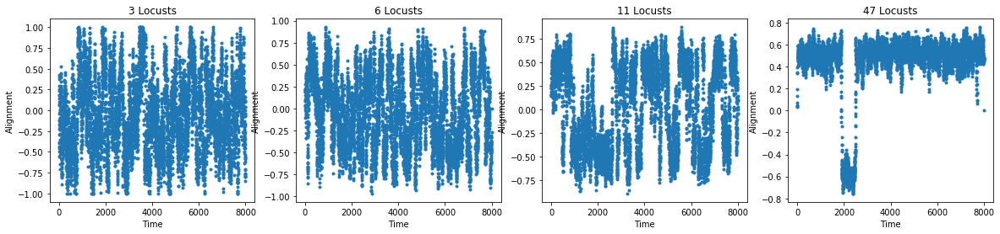

In [196]:
fig, ax = plt.subplots(1,np.size(locust_nums),squeeze=False)
fig.set_figwidth(5*np.size(locust_nums))
for i in range(np.size(locust_nums)):
  ax[0,i].plot(range(steps),phi_all[i],'.');
  ax[0,i].set_ylabel('Alignment')
  ax[0,i].set_xlabel('Time')
  ax[0,i].set_title(str(locust_nums[i])+' Locusts')

We find that 11 locusts switch less than described in the paper, but probably due to small detail in simulation

## Create animation to reveal what's going on under the hood

In [0]:
def update_points(t,x,L,inrange1,l_pts,l_see,l_1,defectors_pos,defectors):
  l_pts.set_data(np.cos(x[t,:]/L*2*np.pi),np.sin(x[t,:]/L*2*np.pi))
  l_see.set_data(np.cos(inrange1[t]/L*2*np.pi),np.sin(inrange1[t]/L*2*np.pi))
  l_1.set_data(np.cos(x[t,1]/L*2*np.pi),np.sin(x[t,1]/L*2*np.pi))
  defectors_pos.set_data(np.cos(x[t,:][defectors]/L*2*np.pi),np.sin(x[t,:][defectors]/L*2*np.pi))
  return l_pts,l_see,

In [0]:
def show_animation(x,inrange1,defectors):

  fig=plt.figure()
  
  a=np.linspace(0,2*np.pi)
  plt.plot(np.cos(a),np.sin(a))
  locust_pos, =plt.plot([], [], '.k')
  locust_see, =plt.plot([],[],'or',fillstyle='none')
  locust1, =plt.plot([],[],'og',fillstyle='none')
  defectors_pos, =plt.plot([],[],'xk')

  plt.xlim(-1.5,1.5)
  plt.ylim(-1.5,1.5)
  plt.gca().axis('equal')

  anim = animation.FuncAnimation(fig, update_points, fargs=(x, L, inrange1,locust_pos,locust_see,locust1,defectors_pos,defectors),
                              frames=100, interval=100, blit=True)
  plt.close(fig)
  return(anim)

Locusts are dots.

One locust is highlighted with a green square.

Locusts this locust can see are highlighed with red squares

Defectors have a black x over them

In [199]:
#This line makes the animation work in Google Colab:
rc('animation', html='jshtml')
#then generate the animation
show_animation(x_all[0],inrange1_all[0],defectors_all[0])

In [200]:
rc('animation', html='jshtml')
show_animation(x_all[1],inrange1_all[1],defectors_all[1])

In [201]:
rc('animation', html='jshtml')
show_animation(x_all[2],inrange1_all[2],defectors_all[2])

In [202]:
rc('animation', html='jshtml')
show_animation(x_all[3],inrange1_all[3],defectors_all[3])